In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

In [2]:
from keras.utils import image_dataset_from_directory
trainA = np.array(list(image_dataset_from_directory('/kaggle/input/cyclegan/monet2photo/monet2photo/trainA/', label_mode=None).unbatch()))
testA = np.array(list(image_dataset_from_directory('/kaggle/input/cyclegan/monet2photo/monet2photo/testA/', label_mode=None).unbatch()))
trainB = np.array(list(image_dataset_from_directory('/kaggle/input/cyclegan/monet2photo/monet2photo/trainB/', label_mode=None).unbatch()))
testB = np.array(list(image_dataset_from_directory('/kaggle/input/cyclegan/monet2photo/monet2photo/testB/', label_mode=None).unbatch()))

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Found 1072 files belonging to 1 classes.
Found 121 files belonging to 1 classes.
Found 6287 files belonging to 1 classes.
Found 751 files belonging to 1 classes.


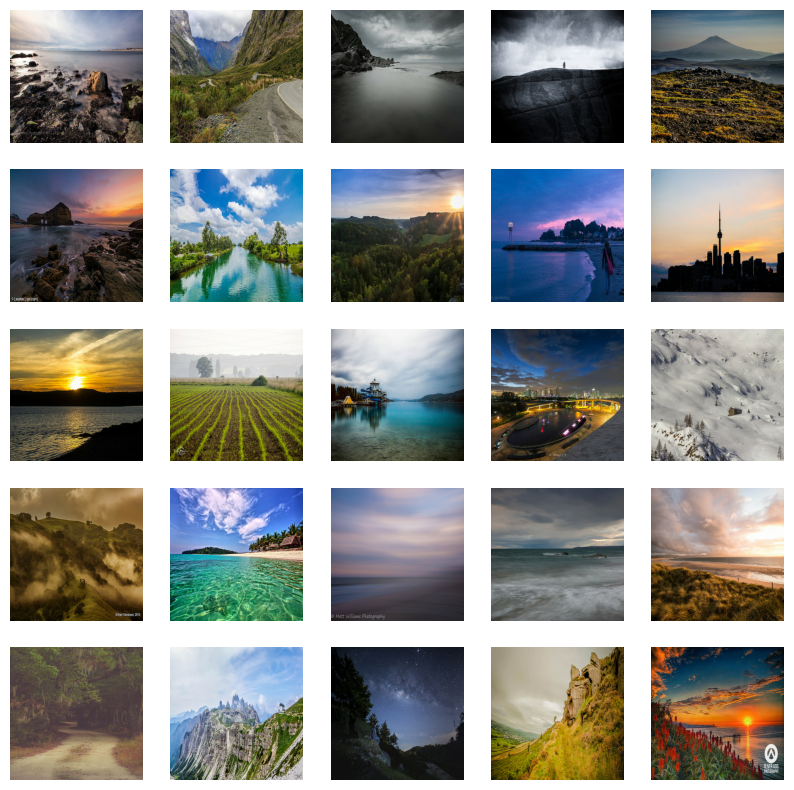

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(trainB[i].astype(np.uint8))
    plt.axis("off")

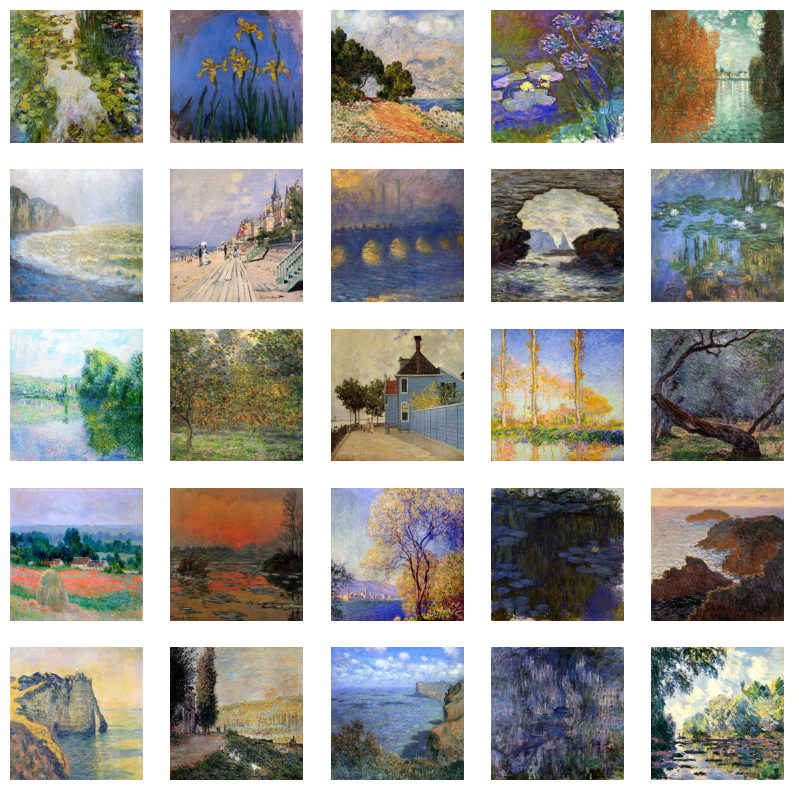

In [4]:
plt.figure(figsize=(10, 10))
for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(trainA[i].astype(np.uint8))
    plt.axis("off")

In [5]:
trainA = (trainA / 127.5) - 1
trainB = (trainB / 127.5) - 1
testA = (testA / 127.5) - 1
testB = (testB / 127.5) - 1

In [6]:
kernel_size = 2
filters = [64, 128, 256, 512, 1028]
image_shape = (trainA.shape[1], trainA.shape[2], trainA.shape[3])

In [7]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-2s29x0q1
  Running command git clone --filter=blob:none --quiet https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-2s29x0q1
  Resolved https://www.github.com/keras-team/keras-contrib.git to commit 3fc5ef709e061416f4bc8a92ca3750c824b5d2b0
  Preparing metadata (setup.py) ... done
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-py3-none-any.whl size=101058 sha256=df2abc0e7813b97ef99d55ef69a4a72701904d29ff6142cd01a0ce73bc536a26
  Stored in directory: /tmp/pip-ephem-wheel-cache-jzyttggb/wheels/74/d5/f7/0245af7ac33d5b0c2e095688649916e4bf9a8d6b3362a849f5
Successfully built keras-contrib


In [8]:
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Conv2D, LeakyReLU, Conv2DTranspose, Dropout, Concatenate, Input

In [9]:
def dblock(input_layer, filters, kernel):
    dl = Conv2D(filters=filters, kernel_size=kernel, strides=2, padding='same')(input_layer)
    dl = LeakyReLU(alpha=0.2)(dl)
    dl = InstanceNormalization(axis=-1)(dl)
    return dl

In [10]:
def ublock(input_layer, skip_layer, filters, kernel, dropout=0.0):
    ul = Conv2DTranspose(filters, kernel_size=kernel, strides=2, padding='same', activation='relu')(input_layer)
    if dropout > 0:
        ul = Dropout(dropout)(ul)
    ul = InstanceNormalization(axis=-1)(ul)
    ul = Concatenate()([ul, skip_layer])
    return ul

In [11]:
from keras import Model
def generator(image_shape, filters, kernel_size):
    input_layer = Input(shape=image_shape)

    d1 = dblock(input_layer, filters[0], kernel_size)
    d2 = dblock(d1, filters[1], kernel_size)
    d3 = dblock(d2, filters[2], kernel_size)
    d4 = dblock(d3, filters[3], kernel_size)
    d5 = dblock(d4, filters[4], kernel_size)

    u1 = ublock(d5, d4, filters[3], kernel_size, 0.2)
    u2 = ublock(u1, d3, filters[2], kernel_size, 0.2)
    u3 = ublock(u2, d2, filters[1], kernel_size)
    u4 = ublock(u3, d1, filters[0], kernel_size)
    u5 = Conv2DTranspose(3, kernel_size=kernel_size*2, strides=2, padding='same', activation='tanh')(u4)
    
    return Model(input_layer, u5)

In [12]:
def discriminator_block(input_layer, filters, kernel_size):
    dl = Conv2D(filters, kernel_size=kernel_size, strides=2, padding='same')(input_layer)
    dl = LeakyReLU(alpha=0.2)(dl)
    dl = InstanceNormalization(axis=-1)(dl)
    return dl

In [13]:
def discriminator(image_shape, filters, kernel_size):
    input_layer = Input(shape=image_shape)
    
    disc1 = discriminator_block(input_layer, filters[0], kernel_size)
    disc2 = discriminator_block(disc1, filters[1], kernel_size)
    disc3 = discriminator_block(disc2, filters[2], kernel_size)
    disc4 = discriminator_block(disc3, filters[3], kernel_size)
    output = Conv2D(1, kernel_size=kernel_size, strides=1, padding='same', activation='sigmoid')(disc4)
    
    return Model(input_layer, output)

In [14]:
disc_A = discriminator(image_shape, filters, 4)
disc_B = discriminator(image_shape, filters, 4)

gen_AB = generator(image_shape, filters, 2)
gen_BA = generator(image_shape, filters, 2)

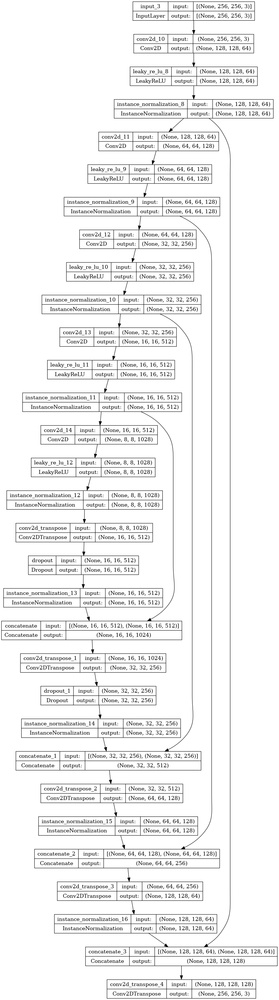

In [15]:
from keras.utils import plot_model
plot_model(gen_AB, show_shapes=True)

In [16]:
from keras.models import load_model
cust = {'InstanceNormalization': InstanceNormalization}

#disc_A = load_model('/kaggle/output/disc_A.h5', cust)
#disc_B = load_model('/kaggle/output/disc_B.h5', cust)
#gen_AB = load_model('/kaggle/output/gen_AB.h5', cust)
#gen_BA = load_model('/kaggle/output/gen_BA.h5', cust)

In [17]:
from keras.optimizers import Adam
lambda_cycle = 10.0
lambda_identity = 0.1 * lambda_cycle
optimizer = Adam(0.0002, 0.5)
patch = 16
patch_gan_shape = (patch, patch, 1)

disc_A.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])
disc_B.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

img_A = Input(shape=image_shape)
img_B = Input(shape=image_shape)

fake_A = gen_BA(img_B)
fake_B = gen_AB(img_A)

reconstruct_A = gen_BA(fake_B)
reconstruct_B = gen_AB(fake_A)

identity_A = gen_BA(img_A)
identity_B = gen_AB(img_B)

disc_A.trainable = False
disc_B.trainable = False

output_A = disc_A(fake_A)
output_B = disc_B(fake_B)

gan = Model(inputs=[img_A, img_B], outputs=[output_A, output_B, reconstruct_A, reconstruct_B, identity_A, identity_B])
gan.compile(
    loss=['mse', 'mse', 
          'mae', 'mae', 'mae', 'mae'], 
    loss_weights=[1, 1, lambda_cycle, lambda_cycle, lambda_identity, lambda_identity], 
    optimizer=optimizer)

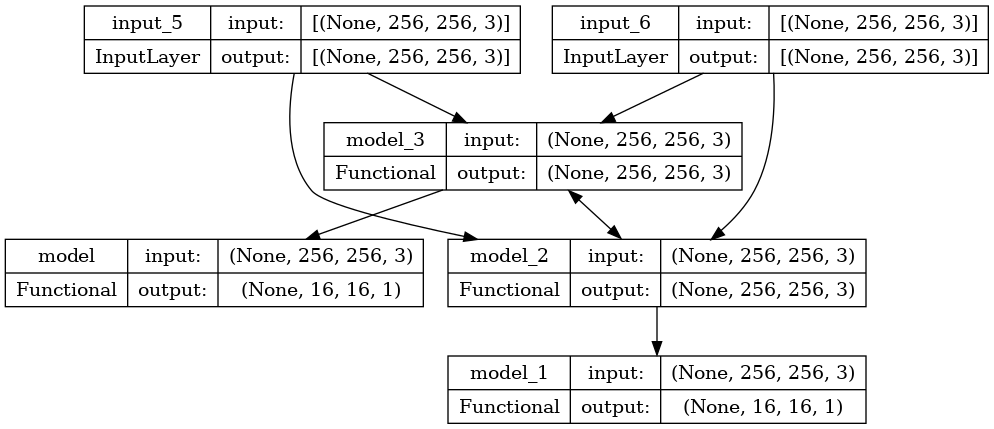

In [18]:
plot_model(gan, show_shapes=True)

In [19]:
import random

def train(gen_AB, gen_BA, disc_A, disc_B, gan, patch_gan_shape, epochs, batch_size):
    real_y = np.ones((batch_size, ) + patch_gan_shape)
    fake_y = np.zeros((batch_size, ) + patch_gan_shape)
    for epoch in range(epochs):
        print("Epoch={}".format(epoch))
        sampleA = trainA[random.sample(range(0, trainA.shape[0]), batch_size)]
        sampleB = trainB[random.sample(range(0, trainB.shape[0]), batch_size)]
        fakeA = gen_BA.predict(sampleB)
        fakeB = gen_AB.predict(sampleA)
        disc_A_loss_real = disc_A.train_on_batch(sampleA, real_y)
        disc_A_loss_fake = disc_A.train_on_batch(fakeA, fake_y)
        disc_A_loss = 0.5 * np.add(disc_A_loss_real, disc_A_loss_fake)
        disc_B_loss_real = disc_B.train_on_batch(sampleB, real_y)
        disc_B_loss_fake = disc_B.train_on_batch(fakeB, fake_y)
        disc_B_loss = 0.5 * np.add(disc_B_loss_real, disc_B_loss_fake)
        discriminator_loss = 0.5 * np.add(disc_A_loss, disc_B_loss)
        gan_loss = gan.train_on_batch([sampleA, sampleB], 
                                      [real_y, real_y, sampleA, sampleB, sampleA, sampleB])
        if epoch % 10 == 0:
            print("Epoch {}, discriminator loss {}, accuracy {}, generator loss {}, adversarial loss {}, reconstruction loss {}, identity loss {}"
            .format(epoch, discriminator_loss[0], 100*discriminator_loss[1], gan_loss[0], np.mean(gan_loss[1:3]), np.mean(gan_loss[3:5]), np.mean(gan_loss[5:7])))
            predicted = gen_BA.predict(testB[:4])
            predicted = (predicted + 1) * 127.5
            plt.figure(figsize=(10, 10))
            for i in range(4):
                ax = plt.subplot(4, 4, 2 * i + 1)
                plt.imshow(predicted[i].astype(np.uint8))
                plt.axis("off")
                ax = plt.subplot(4, 4, 2 * i + 2)
                plt.imshow(((testB[i] + 1) * 127.5).astype(np.uint8))
                plt.axis("off")
            plt.show()
        if epoch % 50 == 0:
            disc_A.save('/kaggle/working/disc_A.h5')
            disc_B.save('/kaggle/working/disc_B.h5')
            gen_AB.save('/kaggle/working/gen_AB.h5')
            gen_BA.save('/kaggle/working/gen_BA.h5')


Epoch=0
1/1 [==============================] - 0s 373ms/step


2023-10-21 11:12:16.518996: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/model_2/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch 0, discriminator loss 0.319066546857357, accuracy 50.605470687150955, generator loss 13.637858390808105, adversarial loss 0.40892016887664795, reconstruction loss 0.586302250623703, identity loss 0.5469868779182434
1/1 [==============================] - 0s 108ms/step


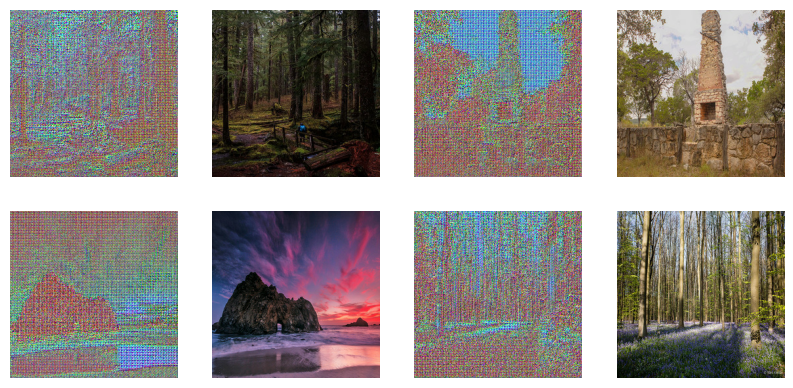

Epoch=1
1/1 [==============================] - 0s 25ms/step
Epoch=2
1/1 [==============================] - 0s 23ms/step
Epoch=3
1/1 [==============================] - 0s 23ms/step
Epoch=4
1/1 [==============================] - 0s 23ms/step
Epoch=5
1/1 [==============================] - 0s 26ms/step
Epoch=6
1/1 [==============================] - 0s 26ms/step
Epoch=7
1/1 [==============================] - 0s 29ms/step
Epoch=8
1/1 [==============================] - 0s 22ms/step
Epoch=9
1/1 [==============================] - 0s 23ms/step
Epoch=10
1/1 [==============================] - 0s 23ms/step
Epoch 10, discriminator loss 0.33702218160033226, accuracy 55.96679821610451, generator loss 8.988008499145508, adversarial loss 0.4403780698776245, reconstruction loss 0.36032217741012573, identity loss 0.450404092669487
1/1 [==============================] - 0s 22ms/step


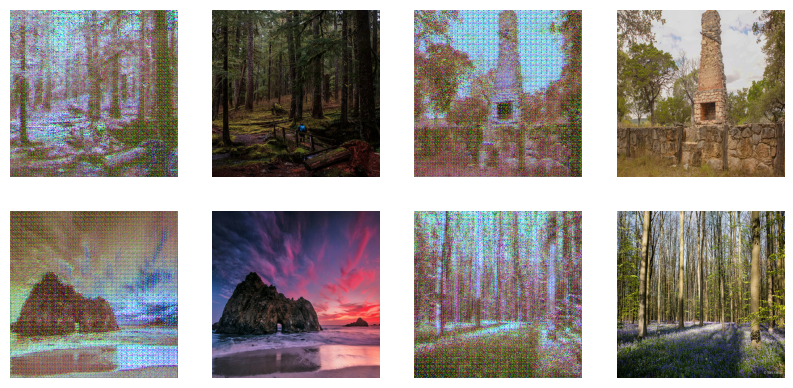

Epoch=11
1/1 [==============================] - 0s 23ms/step
Epoch=12
1/1 [==============================] - 0s 23ms/step
Epoch=13
1/1 [==============================] - 0s 22ms/step
Epoch=14
1/1 [==============================] - 0s 22ms/step
Epoch=15
1/1 [==============================] - 0s 26ms/step
Epoch=16
1/1 [==============================] - 0s 23ms/step
Epoch=17
1/1 [==============================] - 0s 23ms/step
Epoch=18
1/1 [==============================] - 0s 26ms/step
Epoch=19
1/1 [==============================] - 0s 22ms/step
Epoch=20
1/1 [==============================] - 0s 22ms/step
Epoch 20, discriminator loss 0.21987904608249664, accuracy 67.43164211511612, generator loss 7.85990047454834, adversarial loss 0.4635968655347824, reconstruction loss 0.30954018235206604, identity loss 0.3709518611431122
1/1 [==============================] - 0s 22ms/step


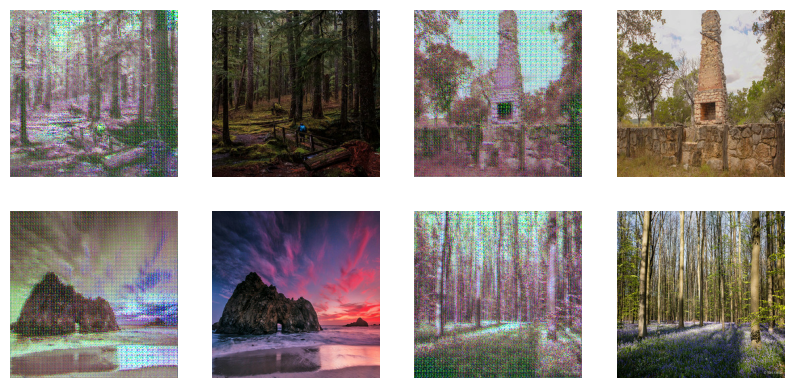

Epoch=21
1/1 [==============================] - 0s 24ms/step
Epoch=22
1/1 [==============================] - 0s 22ms/step
Epoch=23
1/1 [==============================] - 0s 22ms/step
Epoch=24
1/1 [==============================] - 0s 24ms/step
Epoch=25
1/1 [==============================] - 0s 23ms/step
Epoch=26
1/1 [==============================] - 0s 25ms/step
Epoch=27
1/1 [==============================] - 0s 22ms/step
Epoch=28
1/1 [==============================] - 0s 22ms/step
Epoch=29
1/1 [==============================] - 0s 27ms/step
Epoch=30
1/1 [==============================] - 0s 27ms/step
Epoch 30, discriminator loss 0.1605838444083929, accuracy 77.20703035593033, generator loss 7.1806464195251465, adversarial loss 0.47532470524311066, reconstruction loss 0.2788315713405609, identity loss 0.32668282091617584
1/1 [==============================] - 0s 22ms/step


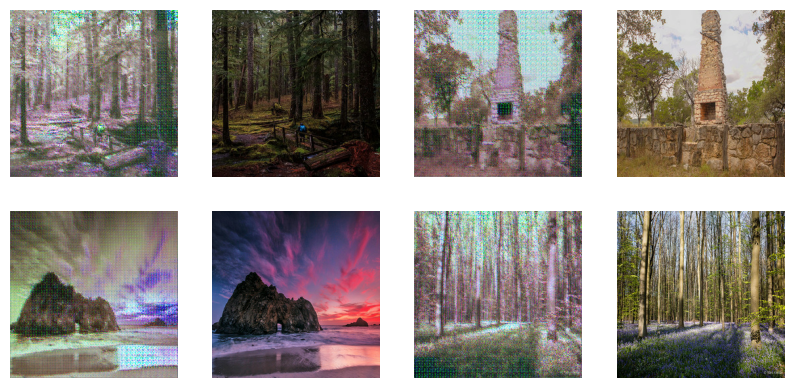

Epoch=31
1/1 [==============================] - 0s 23ms/step
Epoch=32
1/1 [==============================] - 0s 23ms/step
Epoch=33
1/1 [==============================] - 0s 22ms/step
Epoch=34
1/1 [==============================] - 0s 22ms/step
Epoch=35
1/1 [==============================] - 0s 23ms/step
Epoch=36
1/1 [==============================] - 0s 22ms/step
Epoch=37
1/1 [==============================] - 0s 26ms/step
Epoch=38
1/1 [==============================] - 0s 22ms/step
Epoch=39
1/1 [==============================] - 0s 22ms/step
Epoch=40
1/1 [==============================] - 0s 22ms/step
Epoch 40, discriminator loss 0.16366855893284082, accuracy 76.40624940395355, generator loss 6.954390048980713, adversarial loss 0.4755445271730423, reconstruction loss 0.26984037458896637, identity loss 0.30324679613113403
1/1 [==============================] - 0s 20ms/step


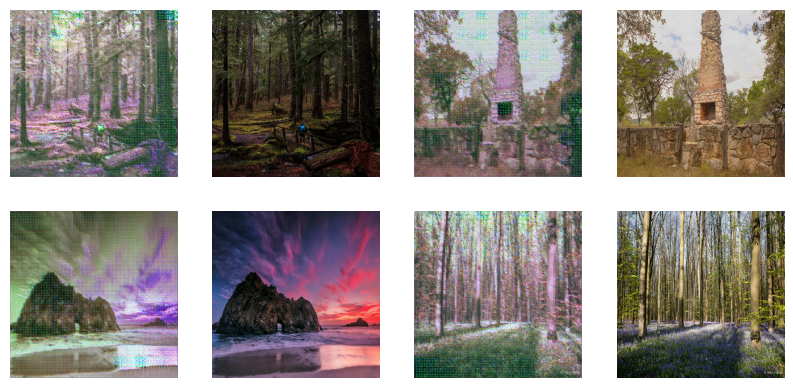

Epoch=41
1/1 [==============================] - 0s 22ms/step
Epoch=42
1/1 [==============================] - 0s 24ms/step
Epoch=43
1/1 [==============================] - 0s 22ms/step
Epoch=44
1/1 [==============================] - 0s 24ms/step
Epoch=45
1/1 [==============================] - 0s 24ms/step
Epoch=46
1/1 [==============================] - 0s 22ms/step
Epoch=47
1/1 [==============================] - 0s 22ms/step
Epoch=48
1/1 [==============================] - 0s 22ms/step
Epoch=49
1/1 [==============================] - 0s 28ms/step
Epoch=50
1/1 [==============================] - 0s 23ms/step
Epoch 50, discriminator loss 0.18381138145923615, accuracy 73.4570324420929, generator loss 6.968592643737793, adversarial loss 0.5124167948961258, reconstruction loss 0.26787540316581726, identity loss 0.2931256592273712
1/1 [==============================] - 0s 20ms/step


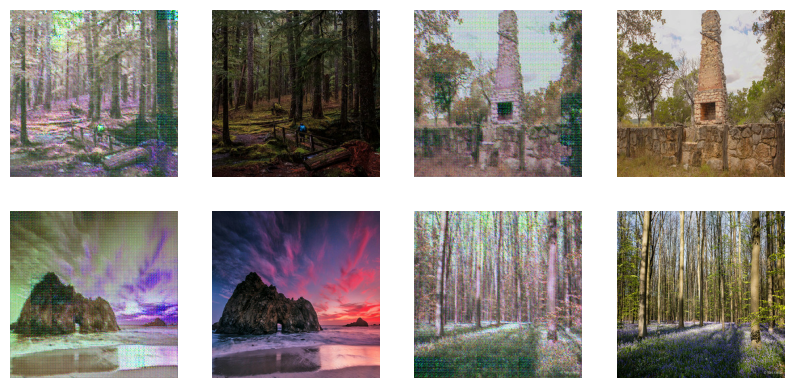

Epoch=51
1/1 [==============================] - 0s 23ms/step
Epoch=52
1/1 [==============================] - 0s 22ms/step
Epoch=53
1/1 [==============================] - 0s 25ms/step
Epoch=54
1/1 [==============================] - 0s 22ms/step
Epoch=55
1/1 [==============================] - 0s 22ms/step
Epoch=56
1/1 [==============================] - 0s 23ms/step
Epoch=57
1/1 [==============================] - 0s 24ms/step
Epoch=58
1/1 [==============================] - 0s 26ms/step
Epoch=59
1/1 [==============================] - 0s 25ms/step
Epoch=60
1/1 [==============================] - 0s 26ms/step
Epoch 60, discriminator loss 0.1981639266014099, accuracy 70.5078125, generator loss 6.134930610656738, adversarial loss 0.5236531049013138, reconstruction loss 0.22926057875156403, identity loss 0.25120648741722107
1/1 [==============================] - 0s 21ms/step


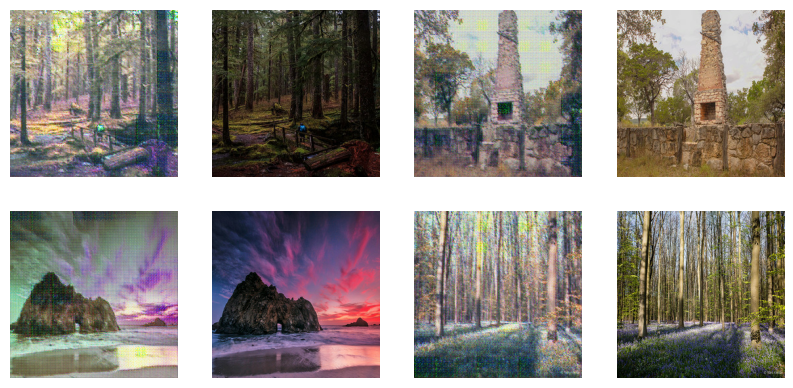

Epoch=61
1/1 [==============================] - 0s 25ms/step
Epoch=62
1/1 [==============================] - 0s 24ms/step
Epoch=63
1/1 [==============================] - 0s 25ms/step
Epoch=64
1/1 [==============================] - 0s 24ms/step
Epoch=65
1/1 [==============================] - 0s 25ms/step
Epoch=66
1/1 [==============================] - 0s 24ms/step
Epoch=67
1/1 [==============================] - 0s 22ms/step
Epoch=68
1/1 [==============================] - 0s 23ms/step
Epoch=69
1/1 [==============================] - 0s 25ms/step
Epoch=70
1/1 [==============================] - 0s 22ms/step
Epoch 70, discriminator loss 0.21669917181134224, accuracy 66.98242127895355, generator loss 6.449967384338379, adversarial loss 0.5285079479217529, reconstruction loss 0.24413855373859406, identity loss 0.25509001314640045
1/1 [==============================] - 0s 21ms/step


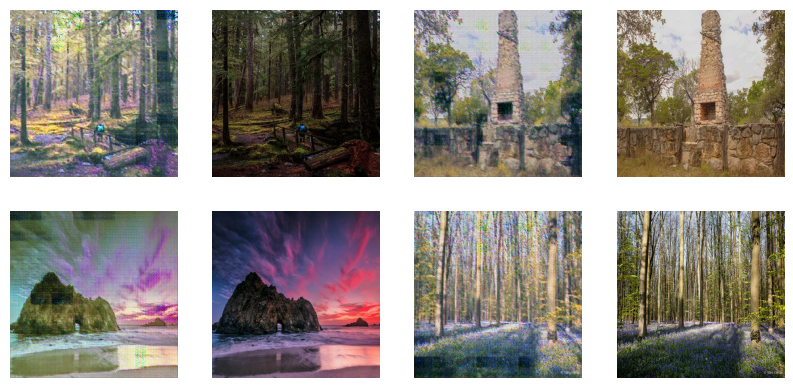

Epoch=71
1/1 [==============================] - 0s 23ms/step
Epoch=72
1/1 [==============================] - 0s 23ms/step
Epoch=73
1/1 [==============================] - 0s 22ms/step
Epoch=74
1/1 [==============================] - 0s 22ms/step
Epoch=75
1/1 [==============================] - 0s 22ms/step
Epoch=76
1/1 [==============================] - 0s 23ms/step
Epoch=77
1/1 [==============================] - 0s 22ms/step
Epoch=78
1/1 [==============================] - 0s 22ms/step
Epoch=79
1/1 [==============================] - 0s 22ms/step
Epoch=80
1/1 [==============================] - 0s 23ms/step
Epoch 80, discriminator loss 0.2493611853569746, accuracy 60.43945401906967, generator loss 5.806069374084473, adversarial loss 0.43979406356811523, reconstruction loss 0.22394993156194687, identity loss 0.2237413227558136
1/1 [==============================] - 0s 20ms/step


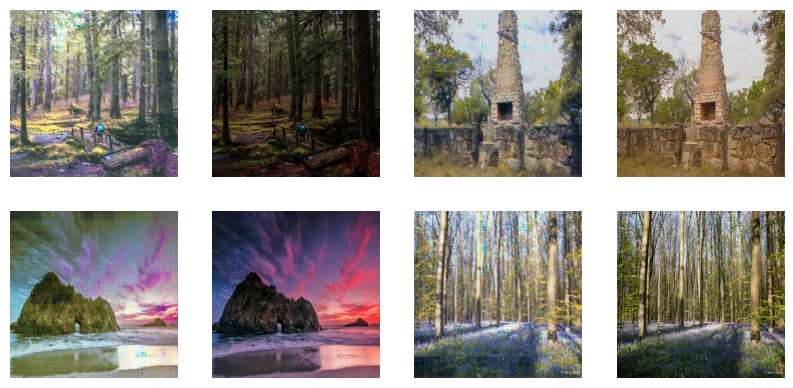

Epoch=81
1/1 [==============================] - 0s 22ms/step
Epoch=82
1/1 [==============================] - 0s 22ms/step
Epoch=83
1/1 [==============================] - 0s 22ms/step
Epoch=84
1/1 [==============================] - 0s 22ms/step
Epoch=85
1/1 [==============================] - 0s 22ms/step
Epoch=86
1/1 [==============================] - 0s 22ms/step
Epoch=87
1/1 [==============================] - 0s 24ms/step
Epoch=88
1/1 [==============================] - 0s 22ms/step
Epoch=89
1/1 [==============================] - 0s 23ms/step
Epoch=90
1/1 [==============================] - 0s 22ms/step
Epoch 90, discriminator loss 0.18208146840333939, accuracy 73.95507842302322, generator loss 7.828391075134277, adversarial loss 0.559383749961853, reconstruction loss 0.3050478994846344, identity loss 0.3043328672647476
1/1 [==============================] - 0s 20ms/step


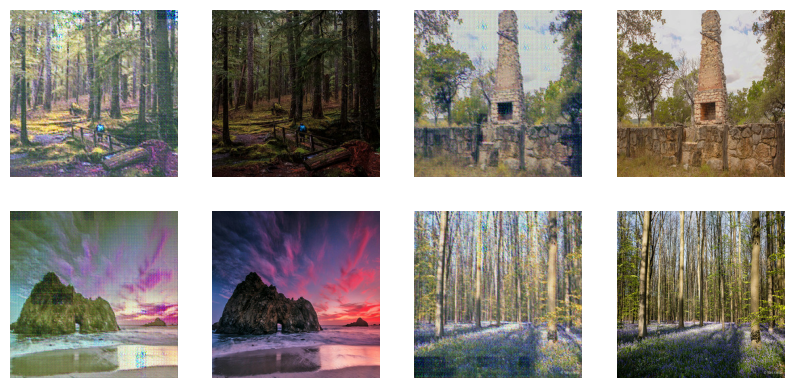

Epoch=91
1/1 [==============================] - 0s 22ms/step
Epoch=92
1/1 [==============================] - 0s 23ms/step
Epoch=93
1/1 [==============================] - 0s 22ms/step
Epoch=94
1/1 [==============================] - 0s 22ms/step
Epoch=95
1/1 [==============================] - 0s 23ms/step
Epoch=96
1/1 [==============================] - 0s 23ms/step
Epoch=97
1/1 [==============================] - 0s 23ms/step
Epoch=98
1/1 [==============================] - 0s 23ms/step
Epoch=99
1/1 [==============================] - 0s 23ms/step
Epoch=100
1/1 [==============================] - 0s 23ms/step
Epoch 100, discriminator loss 0.14854662865400314, accuracy 78.82812470197678, generator loss 6.062262535095215, adversarial loss 0.6047244071960449, reconstruction loss 0.22006607800722122, identity loss 0.22574593871831894
1/1 [==============================] - 0s 20ms/step


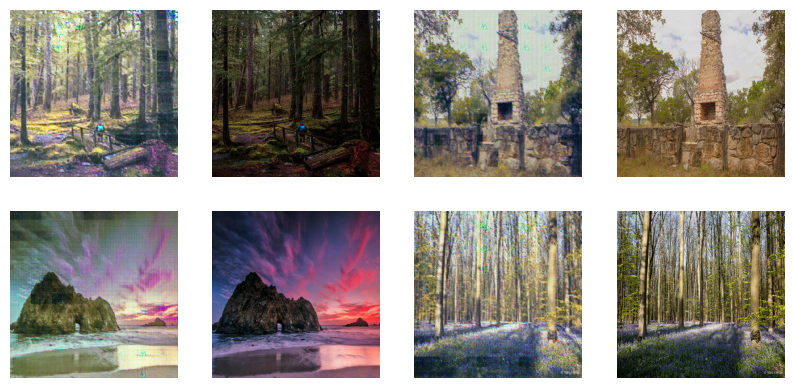

Epoch=101
1/1 [==============================] - 0s 22ms/step
Epoch=102
1/1 [==============================] - 0s 23ms/step
Epoch=103
1/1 [==============================] - 0s 27ms/step
Epoch=104
1/1 [==============================] - 0s 22ms/step
Epoch=105
1/1 [==============================] - 0s 24ms/step
Epoch=106
1/1 [==============================] - 0s 26ms/step
Epoch=107
1/1 [==============================] - 0s 27ms/step
Epoch=108
1/1 [==============================] - 0s 22ms/step
Epoch=109
1/1 [==============================] - 0s 22ms/step
Epoch=110
1/1 [==============================] - 0s 22ms/step
Epoch 110, discriminator loss 0.10402813274413347, accuracy 86.03515625, generator loss 7.580914497375488, adversarial loss 0.6705292463302612, reconstruction loss 0.2837457060813904, identity loss 0.282470703125
1/1 [==============================] - 0s 20ms/step


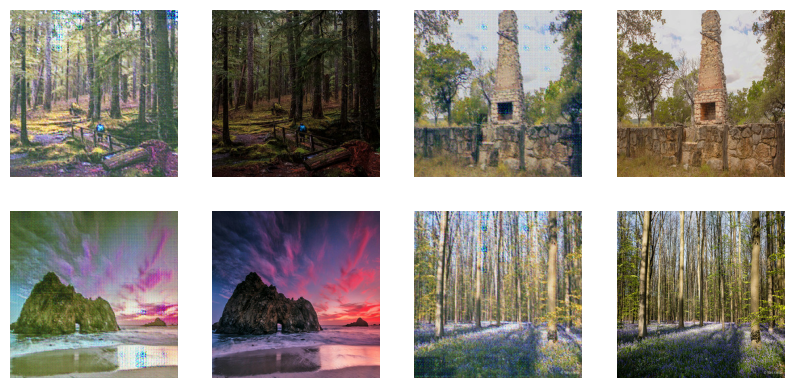

Epoch=111
1/1 [==============================] - 0s 23ms/step
Epoch=112
1/1 [==============================] - 0s 22ms/step
Epoch=113
1/1 [==============================] - 0s 22ms/step
Epoch=114
1/1 [==============================] - 0s 26ms/step
Epoch=115
1/1 [==============================] - 0s 23ms/step
Epoch=116
1/1 [==============================] - 0s 26ms/step
Epoch=117
1/1 [==============================] - 0s 22ms/step
Epoch=118
1/1 [==============================] - 0s 22ms/step
Epoch=119
1/1 [==============================] - 0s 23ms/step
Epoch=120
1/1 [==============================] - 0s 23ms/step
Epoch 120, discriminator loss 0.09325739927589893, accuracy 88.1054699420929, generator loss 6.868722438812256, adversarial loss 0.7121239602565765, reconstruction loss 0.24667459726333618, identity loss 0.25549155473709106
1/1 [==============================] - 0s 20ms/step


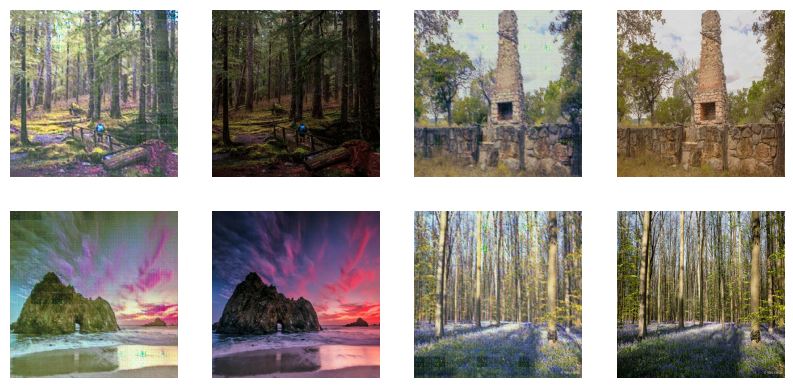

Epoch=121
1/1 [==============================] - 0s 23ms/step
Epoch=122
1/1 [==============================] - 0s 22ms/step
Epoch=123
1/1 [==============================] - 0s 25ms/step
Epoch=124
1/1 [==============================] - 0s 21ms/step
Epoch=125
1/1 [==============================] - 0s 23ms/step
Epoch=126
1/1 [==============================] - 0s 22ms/step
Epoch=127
1/1 [==============================] - 0s 23ms/step
Epoch=128
1/1 [==============================] - 0s 22ms/step
Epoch=129
1/1 [==============================] - 0s 22ms/step
Epoch=130
1/1 [==============================] - 0s 22ms/step
Epoch 130, discriminator loss 0.09782978240400553, accuracy 86.8457019329071, generator loss 6.5002946853637695, adversarial loss 0.7228662371635437, reconstruction loss 0.22975335270166397, identity loss 0.22974726557731628
1/1 [==============================] - 0s 20ms/step


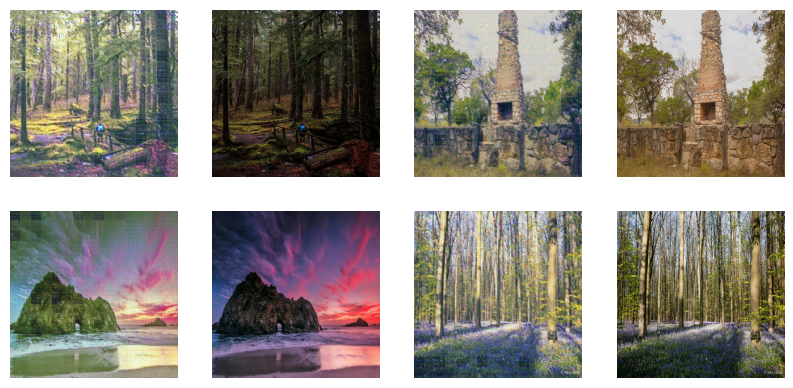

Epoch=131
1/1 [==============================] - 0s 23ms/step
Epoch=132
1/1 [==============================] - 0s 22ms/step
Epoch=133
1/1 [==============================] - 0s 22ms/step
Epoch=134
1/1 [==============================] - 0s 23ms/step
Epoch=135
1/1 [==============================] - 0s 23ms/step
Epoch=136
1/1 [==============================] - 0s 23ms/step
Epoch=137
1/1 [==============================] - 0s 22ms/step
Epoch=138
1/1 [==============================] - 0s 29ms/step
Epoch=139
1/1 [==============================] - 0s 24ms/step
Epoch=140
1/1 [==============================] - 0s 23ms/step
Epoch 140, discriminator loss 0.09083688352257013, accuracy 87.86132782697678, generator loss 8.272829055786133, adversarial loss 0.7345321178436279, reconstruction loss 0.30937957763671875, identity loss 0.3080868422985077
1/1 [==============================] - 0s 20ms/step


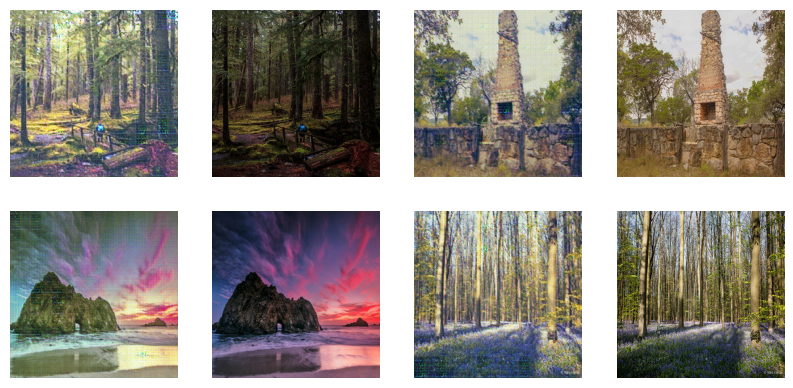

Epoch=141
1/1 [==============================] - 0s 22ms/step
Epoch=142
1/1 [==============================] - 0s 22ms/step
Epoch=143
1/1 [==============================] - 0s 22ms/step
Epoch=144
1/1 [==============================] - 0s 24ms/step
Epoch=145
1/1 [==============================] - 0s 22ms/step
Epoch=146
1/1 [==============================] - 0s 23ms/step
Epoch=147
1/1 [==============================] - 0s 25ms/step
Epoch=148
1/1 [==============================] - 0s 22ms/step
Epoch=149
1/1 [==============================] - 0s 22ms/step
Epoch=150
1/1 [==============================] - 0s 22ms/step
Epoch 150, discriminator loss 0.18651832733303308, accuracy 73.60351458191872, generator loss 7.269742012023926, adversarial loss 0.7185289263725281, reconstruction loss 0.2650284618139267, identity loss 0.2660575807094574
1/1 [==============================] - 0s 20ms/step


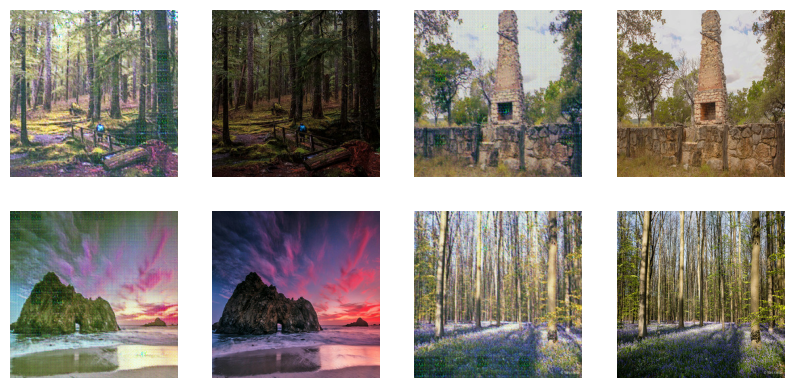

Epoch=151
1/1 [==============================] - 0s 24ms/step
Epoch=152
1/1 [==============================] - 0s 22ms/step
Epoch=153
1/1 [==============================] - 0s 23ms/step
Epoch=154
1/1 [==============================] - 0s 26ms/step
Epoch=155
1/1 [==============================] - 0s 23ms/step
Epoch=156
1/1 [==============================] - 0s 23ms/step
Epoch=157
1/1 [==============================] - 0s 22ms/step
Epoch=158
1/1 [==============================] - 0s 22ms/step
Epoch=159
1/1 [==============================] - 0s 23ms/step
Epoch=160
1/1 [==============================] - 0s 23ms/step
Epoch 160, discriminator loss 0.13890957832336426, accuracy 79.9609363079071, generator loss 6.014467716217041, adversarial loss 0.7843936085700989, reconstruction loss 0.20189554244279861, identity loss 0.20388473570346832
1/1 [==============================] - 0s 20ms/step


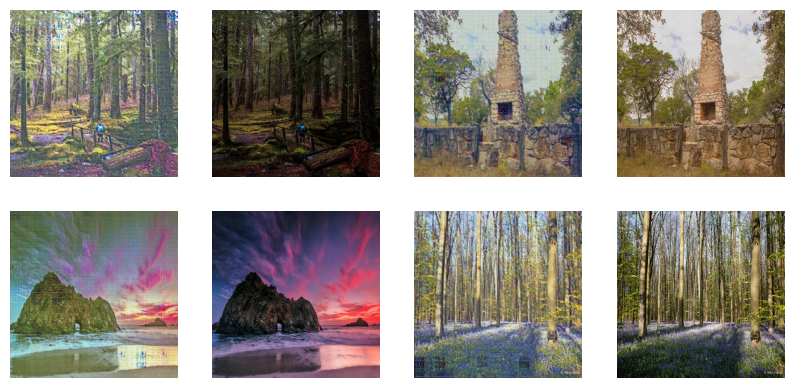

Epoch=161
1/1 [==============================] - 0s 27ms/step
Epoch=162
1/1 [==============================] - 0s 26ms/step
Epoch=163
1/1 [==============================] - 0s 27ms/step
Epoch=164
1/1 [==============================] - 0s 26ms/step
Epoch=165
1/1 [==============================] - 0s 28ms/step
Epoch=166
1/1 [==============================] - 0s 25ms/step
Epoch=167
1/1 [==============================] - 0s 24ms/step
Epoch=168
1/1 [==============================] - 0s 26ms/step
Epoch=169
1/1 [==============================] - 0s 23ms/step
Epoch=170
1/1 [==============================] - 0s 24ms/step
Epoch 170, discriminator loss 0.04685992677696049, accuracy 95.20507752895355, generator loss 7.087278842926025, adversarial loss 0.8162273466587067, reconstruction loss 0.24776504933834076, identity loss 0.24976107478141785
1/1 [==============================] - 0s 22ms/step


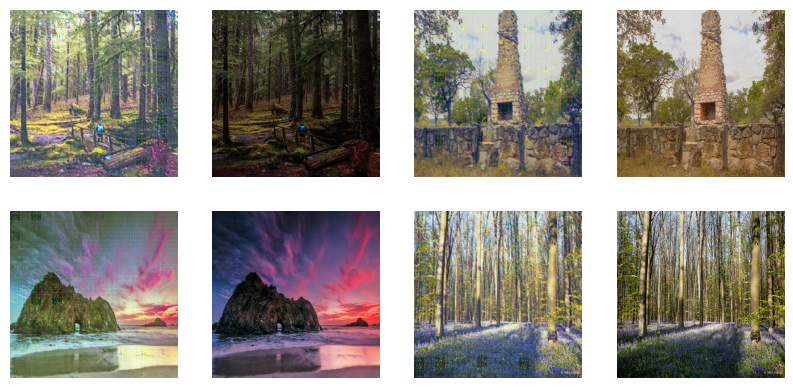

Epoch=171
1/1 [==============================] - 0s 24ms/step
Epoch=172
1/1 [==============================] - 0s 24ms/step
Epoch=173
1/1 [==============================] - 0s 23ms/step
Epoch=174
1/1 [==============================] - 0s 24ms/step
Epoch=175
1/1 [==============================] - 0s 23ms/step
Epoch=176
1/1 [==============================] - 0s 23ms/step
Epoch=177
1/1 [==============================] - 0s 23ms/step
Epoch=178
1/1 [==============================] - 0s 23ms/step
Epoch=179
1/1 [==============================] - 0s 22ms/step
Epoch=180
1/1 [==============================] - 0s 22ms/step
Epoch 180, discriminator loss 0.06771322817075998, accuracy 90.625, generator loss 7.135084629058838, adversarial loss 0.8190306425094604, reconstruction loss 0.25004342198371887, identity loss 0.24807731807231903
1/1 [==============================] - 0s 20ms/step


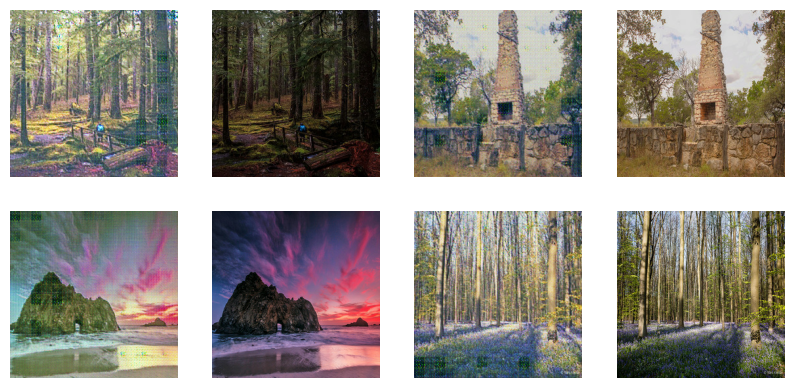

Epoch=181
1/1 [==============================] - 0s 23ms/step
Epoch=182
1/1 [==============================] - 0s 22ms/step
Epoch=183
1/1 [==============================] - 0s 22ms/step
Epoch=184
1/1 [==============================] - 0s 22ms/step
Epoch=185
1/1 [==============================] - 0s 25ms/step
Epoch=186
1/1 [==============================] - 0s 22ms/step
Epoch=187
1/1 [==============================] - 0s 22ms/step
Epoch=188
1/1 [==============================] - 0s 23ms/step
Epoch=189
1/1 [==============================] - 0s 23ms/step
Epoch=190
1/1 [==============================] - 0s 24ms/step
Epoch 190, discriminator loss 0.041753100231289864, accuracy 95.51757723093033, generator loss 7.2050323486328125, adversarial loss 0.8617196381092072, reconstruction loss 0.24933397769927979, identity loss 0.247456893324852
1/1 [==============================] - 0s 20ms/step


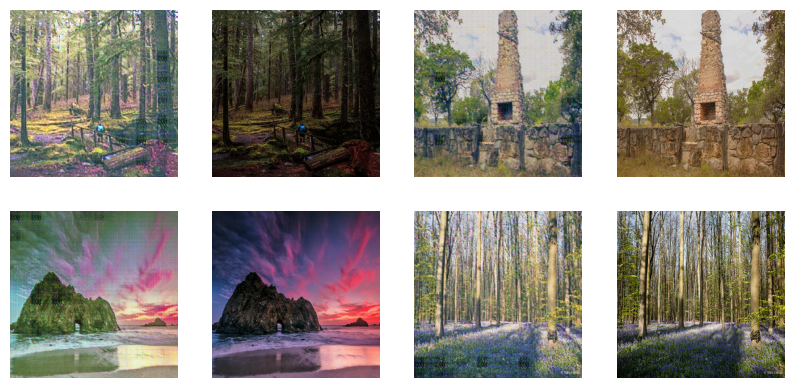

Epoch=191
1/1 [==============================] - 0s 22ms/step
Epoch=192
1/1 [==============================] - 0s 23ms/step
Epoch=193
1/1 [==============================] - 0s 22ms/step
Epoch=194
1/1 [==============================] - 0s 22ms/step
Epoch=195
1/1 [==============================] - 0s 23ms/step
Epoch=196
1/1 [==============================] - 0s 22ms/step
Epoch=197
1/1 [==============================] - 0s 23ms/step
Epoch=198
1/1 [==============================] - 0s 22ms/step
Epoch=199
1/1 [==============================] - 0s 22ms/step


In [20]:
train(gen_AB, gen_BA, disc_A, disc_B, gan, patch_gan_shape, 200, 10)

1/1 [==============================] - 0s 20ms/step


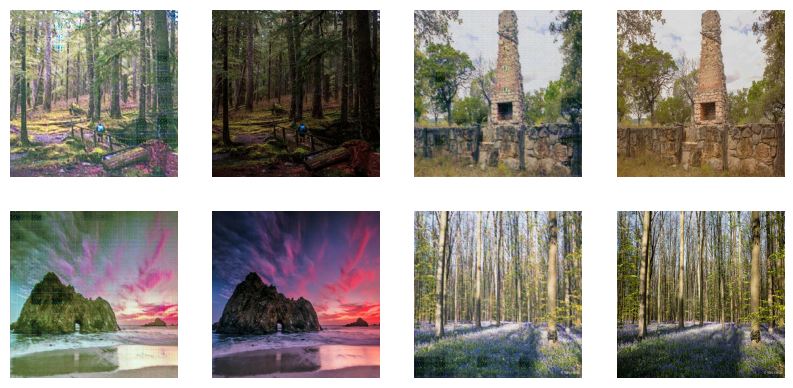

In [21]:
predicted = gen_BA.predict(testB[:4])
predicted = (predicted + 1) * 127.5
plt.figure(figsize=(10, 10))
for i in range(4):
    ax = plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(predicted[i].astype(np.uint8))
    plt.axis("off")
    ax = plt.subplot(4, 4, 2 * i + 2)
    plt.imshow(((testB[i] + 1) * 127.5).astype(np.uint8))
    plt.axis("off")

1/1 [==============================] - 0s 21ms/step


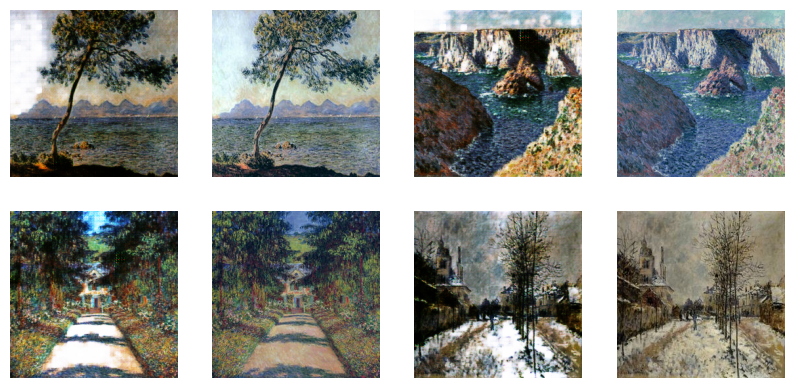

In [22]:
predicted = gen_AB.predict(testA[:4])
predicted = (predicted + 1) * 127.5
plt.figure(figsize=(10, 10))
for i in range(4):
    ax = plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(predicted[i].astype(np.uint8))
    plt.axis("off")
    ax = plt.subplot(4, 4, 2 * i + 2)
    plt.imshow(((testA[i] + 1) * 127.5).astype(np.uint8))
    plt.axis("off")